In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 44.2 MB/s eta 0:00:00


In [ ]:
import kagglehub
from tqdm.auto import tqdm

# Download latest version
path = kagglehub.dataset_download("kushagrapandya/visdrone-dataset")

print("Path to dataset files:", path)

100%|██████████| 2.10G/2.10G [00:55<00:00, 40.6MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/kushagrapandya/visdrone-dataset/versions/1


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/root/.cache/kagglehub/datasets/kushagrapandya/visdrone-dataset/versions/1/VisDrone.yaml
/root/.cache/kagglehub/datasets/kushagrapandya/visdrone-dataset/versions/1/VisDrone2019-DET-test-challenge/VisDrone2019-DET-test-challenge/images/9999961_00000_d_0000020.jpg
/root/.cache/kagglehub/datasets/kushagrapandya/visdrone-dataset/versions/1/VisDrone2019-DET-test-challenge/VisDrone2019-DET-test-challenge/images/9999939_00000_d_0000397.jpg
/root/.cache/kagglehub/datasets/kushagrapandya/visdrone-dataset/versions/1/VisDrone2019-DET-test-challenge/VisDrone2019-DET-test-challenge/images/9999939_00000_d_0000406.jpg
/root/.cache/kagglehub/datasets/kushagrapandya/visdrone-dataset/versions/1/VisDrone2019-DET-test-challenge/VisDrone2019-DET-test-challenge/images/9999988_00000_d_0000035.jpg
/root/.cache/kagglehub/datasets/kushagrapandya/visdrone-dataset/versions/1/VisDrone2019-DET-test-challenge/VisDrone2019-DET-test-challenge/images/9999946_00000_d_0000052.jpg
/root/.cache/kagglehub/datasets/kushagrap

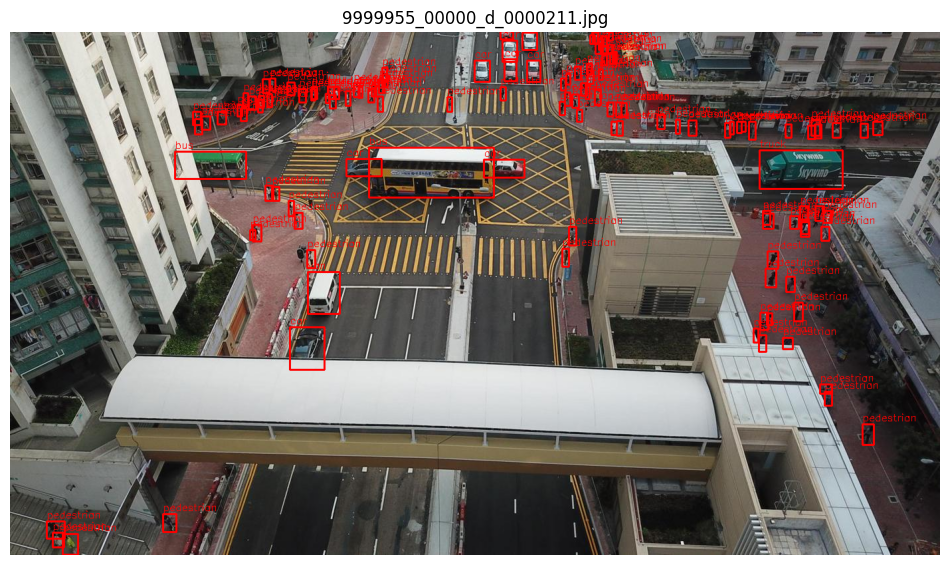

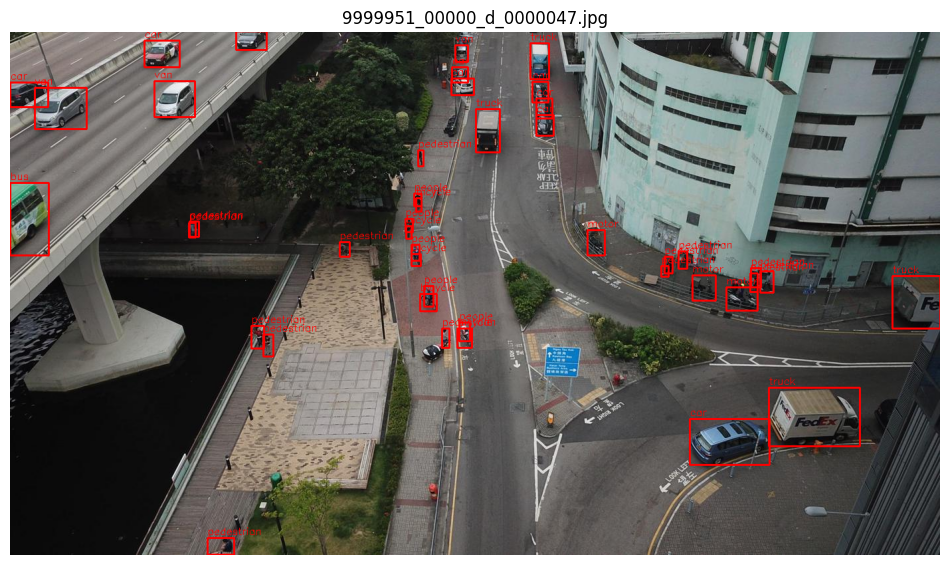

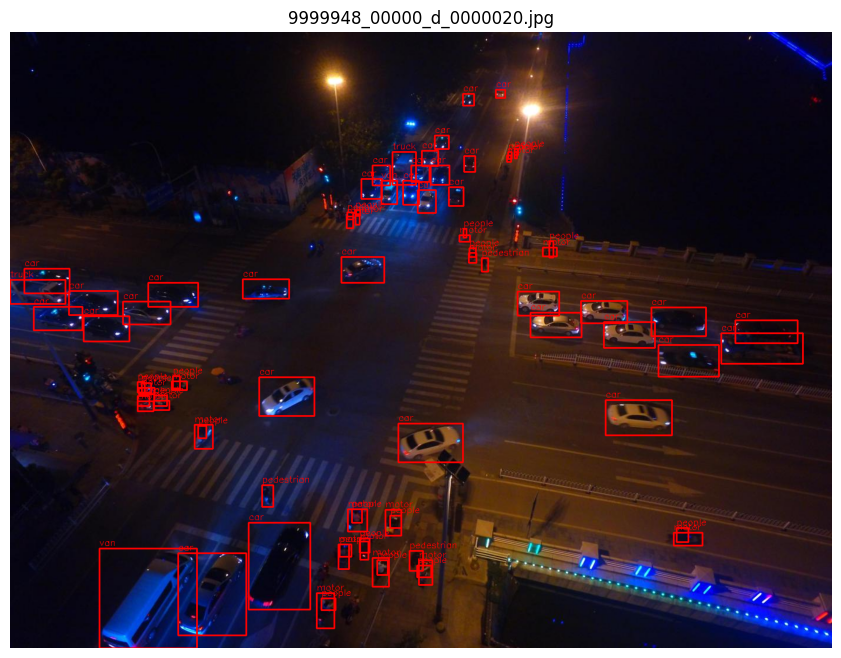

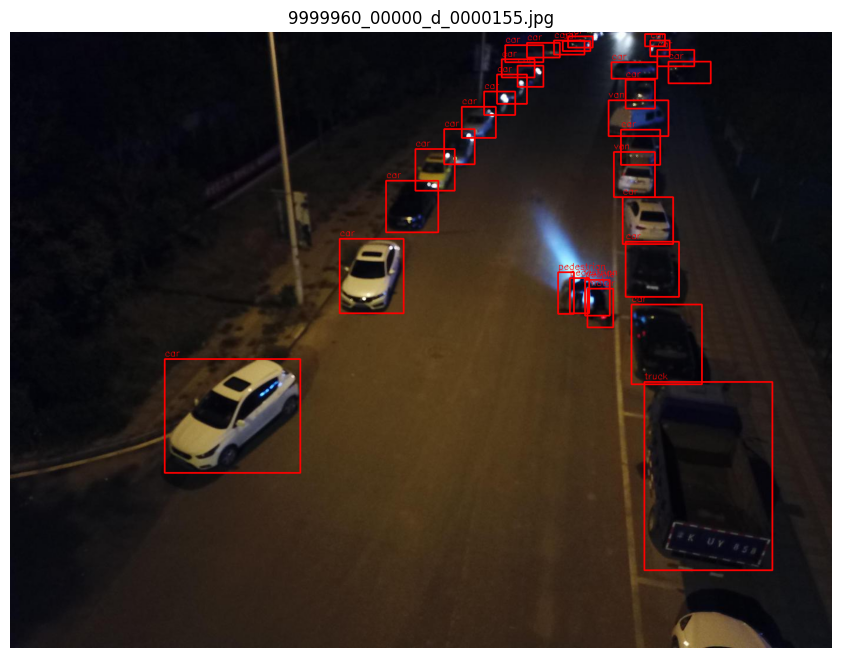

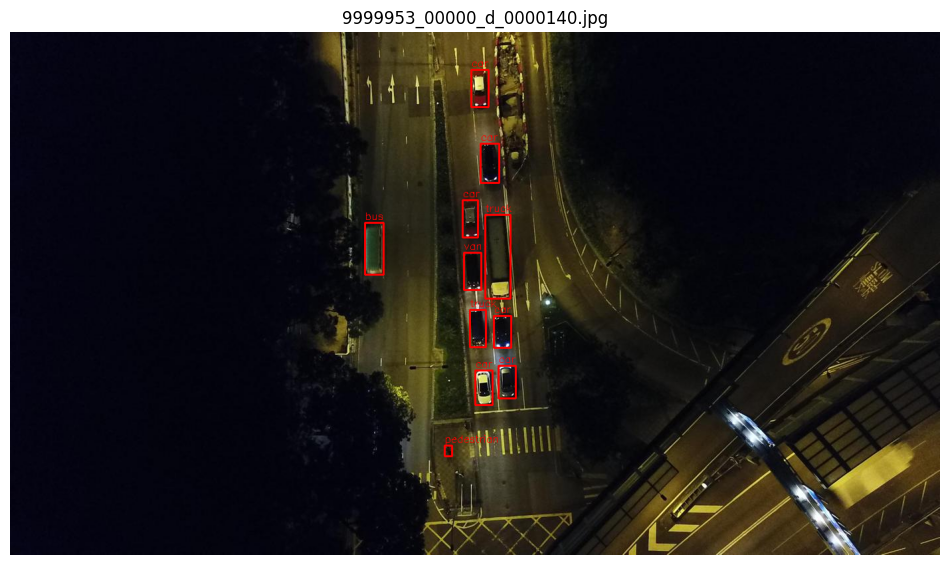

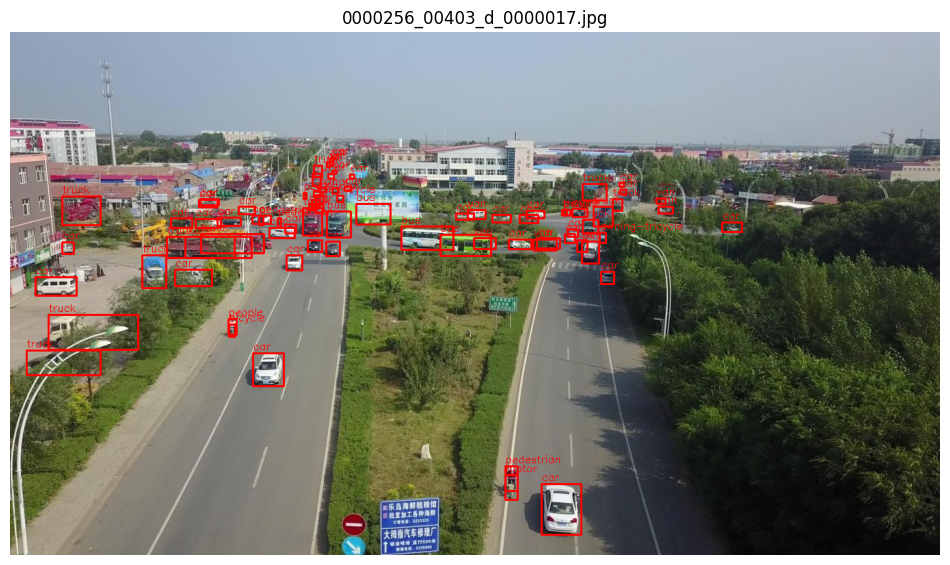

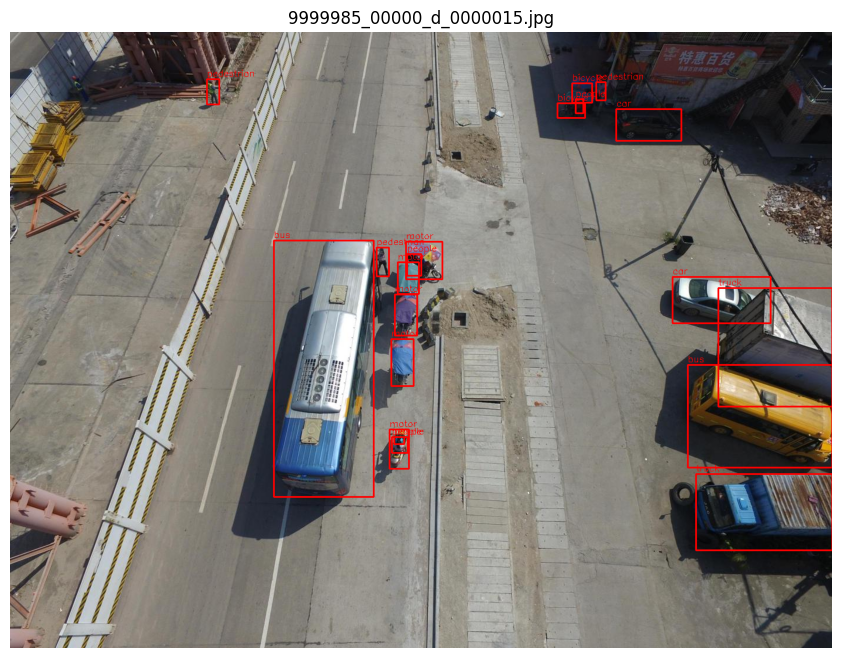

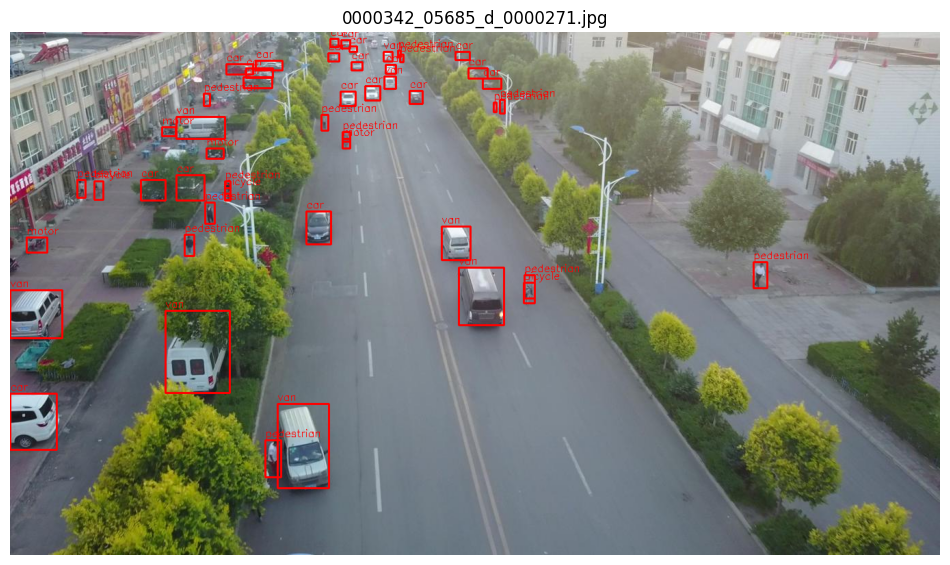

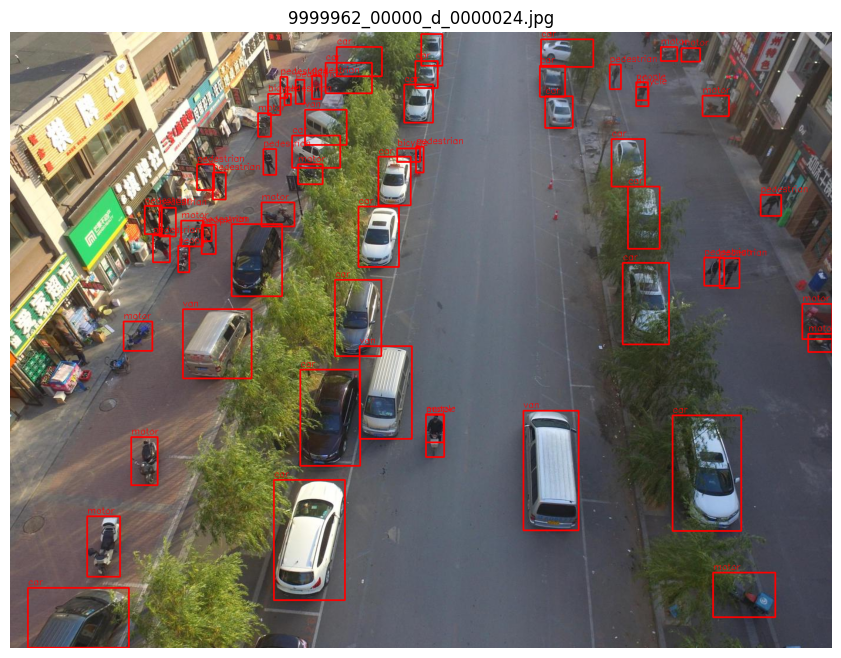

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

images_dir = path + '/VisDrone2019-DET-train/VisDrone2019-DET-train/images'
annotations_dir = path + '/VisDrone2019-DET-train/VisDrone2019-DET-train/annotations'

class_names = {
  0: 'pedestrian',
  1: 'people',
  2: 'bicycle',
  3: 'car',
  4: 'van',
  5: 'truck',
  6: 'tricycle',
  7: 'awning-tricycle',
  8: 'bus',
  9: 'motor'
}

sample_images = os.listdir(images_dir)[:9]

for img_name in sample_images:
    img_path = os.path.join(images_dir, img_name)
    ann_path = os.path.join(annotations_dir, img_name.replace('.jpg', '.txt'))

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    if os.path.exists(ann_path):
        with open(ann_path, 'r') as f:
            lines = f.readlines()

        for line in lines:
            fields = line.strip().split(',')
            x, y, w, h = map(int, fields[:4])
            score = int(fields[4])
            class_id = int(fields[5]) - 1  # VisDrone class_id 1–10

            # Пропускаем ignored regions
            if score == 0:
                continue

            # Рисуем bbox
            cv2.rectangle(img, (x, y), (x + w, y + h), (255, 0, 0), 2)
            class_name = class_names.get(class_id, f"Class {class_id}")
            cv2.putText(img, class_name, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 1)

    plt.figure(figsize=(12,8))
    plt.imshow(img)
    plt.axis('off')
    plt.title(img_name)
    plt.show()


_____________________
_____________________


In [ ]:
from ultralytics import YOLO

# Загружаем предобученную модель YOLOv8n
model = YOLO("yolov8n.pt")


results = model.train(
    data=path + '/VisDrone.yaml',
    epochs=80,
    imgsz=640,
    batch=16,
    #device=0,
    project='/content/drive/MyDrive/DLS_PROJECT/DETECTION',
    optimizer='auto',
    augment=True,
    save=True,
    compile=False
)



Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.5 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/visdrone-dataset/VisDrone.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=80, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8

Converting /content/datasets/VisDrone/VisDrone2019-DET-train: 6471it [00:34, 187.45it/s]
Converting /content/datasets/VisDrone/VisDrone2019-DET-val: 548it [00:05, 105.32it/s]
Converting /content/datasets/VisDrone/VisDrone2019-DET-test-dev: 1610it [00:08, 192.73it/s]

Dataset download success ✅ (76.8s), saved to /content/datasets



Overriding model.yaml nc=80 with nc=10

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

KeyboardInterrupt: 

In [ ]:
from ultralytics import YOLO

model = YOLO('/content/drive/MyDrive/DLS_PROJECT/DETECTION/train/weights/last.pt')

results = model.train(
    data=path + '/VisDrone.yaml',
    epochs=80,           # общее число эпох, YOLO сам учитывает сколько уже прошло
    imgsz=640,
    batch=16,
    device=0,
    project='/content/drive/MyDrive/DLS_PROJECT/DETECTION',
    optimizer='auto',
    augment=True,
    save=True,
    resume=True          # вот ключевой параметр для продолжения
)


Ultralytics 8.4.5 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/visdrone-dataset/VisDrone.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=80, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/DLS_PROJECT/DETECTION/train/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer

KeyboardInterrupt: 

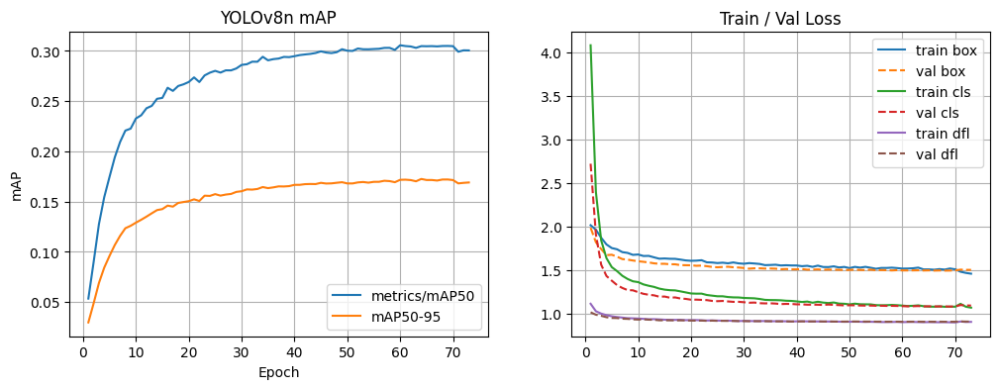

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('/content/drive/MyDrive/DLS_PROJECT/DETECTION/train/results.csv')

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(df['epoch'], df['metrics/mAP50(B)'], label='metrics/mAP50')
plt.plot(df['epoch'], df['metrics/mAP50-95(B)'], label='mAP50-95')

plt.xlabel('Epoch')
plt.ylabel('mAP')
plt.title('YOLOv8n mAP')
plt.legend()
plt.grid()

plt.subplot(1, 2, 2)
for k in ['box', 'cls', 'dfl']:
    plt.plot(df['epoch'], df[f'train/{k}_loss'], label=f'train {k}')
    plt.plot(df['epoch'], df[f'val/{k}_loss'], '--', label=f'val {k}')

plt.legend()
plt.grid()
plt.title('Train / Val Loss')
plt.show()




image 1/1 /root/.cache/kagglehub/datasets/kushagrapandya/visdrone-dataset/versions/1/VisDrone2019-DET-train/VisDrone2019-DET-train/images/9999969_00000_d_0000025.jpg: 480x640 9 pedestrians, 11 cars, 294.6ms
Speed: 5.7ms preprocess, 294.6ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


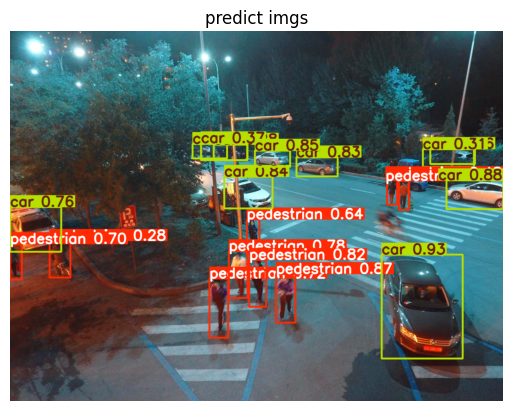

In [ ]:
from ultralytics import YOLO

model = YOLO('/content/drive/MyDrive/DLS_PROJECT/DETECTION/train/weights/last.pt')

result = model.predict('/root/.cache/kagglehub/datasets/kushagrapandya/visdrone-dataset/versions/1/VisDrone2019-DET-train/VisDrone2019-DET-train/images/9999969_00000_d_0000025.jpg')
img = result[0].plot()
plt.imshow(img)
plt.axis('off')
plt.title('predict imgs')
plt.show()

### Видно что мы вышли на плато, нужно менять метод обучения модели !
---------

In [ ]:
from ultralytics import YOLO

# загрузим веса которые у нас получились на предыдушем обучении
model = YOLO('/content/drive/MyDrive/DLS_PROJECT/DETECTION/train/weights/last.pt')

# Будем делать болие толнкий файнтюнинг модели
result = model.train(
    data=path + '/VisDrone.yaml',
    epochs=40,
    imgsz=736,        # чуть увеличим размер картинки (у нас маленькие объекты)
    batch=12,
    device=0,
    optimizer='AdamW',
    lr0=1e-4,         # начальная скорость обучния
    lrf=0.01,         # множитель спада шага обучения
    cos_lr=True,      # косинуснынй спад
    freeze=10,        # замораживаем 10 слоев
    patience=7,       # ранняя остановка

    augment=True,
    plots=True,
    save=True,
    project='/content/drive/MyDrive/DLS_PROJECT/DETECTION',
    name='stage1_froze'

)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.5 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=12, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/kaggle/input/visdrone-dataset/VisDrone.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=10, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=736, int8=False

Converting /content/datasets/VisDrone/VisDrone2019-DET-train: 6471it [00:35, 183.31it/s]
Converting /content/datasets/VisDrone/VisDrone2019-DET-val: 548it [00:04, 119.09it/s]
Converting /content/datasets/VisDrone/VisDrone2019-DET-test-dev: 1610it [00:10, 158.53it/s]

Dataset download success ✅ (397.9s), saved to /content/datasets




                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

In [ ]:
from ultralytics import YOLO
import torch

# загружаем лучшие веса после stage1
model = YOLO('/content/drive/MyDrive/DLS_PROJECT/DETECTION/stage1_froze/weights/best.pt')

results = model.train(
    data=path + '/VisDrone.yaml',
    epochs=40,
    patience=7,                 # раняя остановка
    imgsz=768,
    batch=12,
    optimizer='AdamW',
    lr0=5e-5,                   # медленный старт
    lrf=0.01,
    cos_lr=True,
    weight_decay=5e-4,          # добавляем L2 регуляризацию
    freeze=0,                   # размараживаем все слои
    augment=True,
    close_mosaic=8,
    plots=True,
    save=True,

    project='/content/drive/MyDrive/DLS_PROJECT/DETECTION',
    name='stage2_full_unfreeze'
)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.6 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=12, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=8, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/kaggle/input/visdrone-dataset/VisDrone.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=0, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=768, int8=Fals

Converting /content/datasets/VisDrone/VisDrone2019-DET-train: 6471it [00:33, 191.88it/s]
Converting /content/datasets/VisDrone/VisDrone2019-DET-val: 548it [00:05, 105.90it/s]
Converting /content/datasets/VisDrone/VisDrone2019-DET-test-dev: 1610it [00:08, 179.73it/s]

Dataset download success ✅ (100.1s), saved to /content/datasets




                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

Последний этап файнтюнинга модели

In [ ]:
from ultralytics import YOLO

# Загуружаем веса с предыдушега этапа файнтюнинга
model = YOLO(
    '/content/drive/MyDrive/DLS_PROJECT/DETECTION/stage2_full_unfreeze/weights/best.pt'
)

results = model.train(
    data=path + '/VisDrone.yaml',
    epochs=25,
    patience=7,
    imgsz=832,                    # Увеличим размер картинки
    batch=8,
    optimizer='AdamW',
    lr0=2e-5,                     # Шаг обучения сделаем еще ниже
    lrf=0.1,
    cos_lr=True,

    weight_decay=1e-4,

    augment=False,              # Выключим аугментацию
    close_mosaic=0,
    plots=True,
    save=True,
    project='/content/drive/MyDrive/DLS_PROJECT/DETECTION',
    name='stage3'
)




Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.6 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=0, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/root/.cache/kagglehub/datasets/kushagrapandya/visdrone-dataset/versions/1/VisDrone.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.

Converting /content/datasets/VisDrone/VisDrone2019-DET-train: 6471it [00:34, 188.67it/s]
Converting /content/datasets/VisDrone/VisDrone2019-DET-val: 548it [00:04, 113.51it/s]
Converting /content/datasets/VisDrone/VisDrone2019-DET-test-dev: 1610it [00:07, 204.04it/s]

Dataset download success ✅ (80.7s), saved to /content/datasets




                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

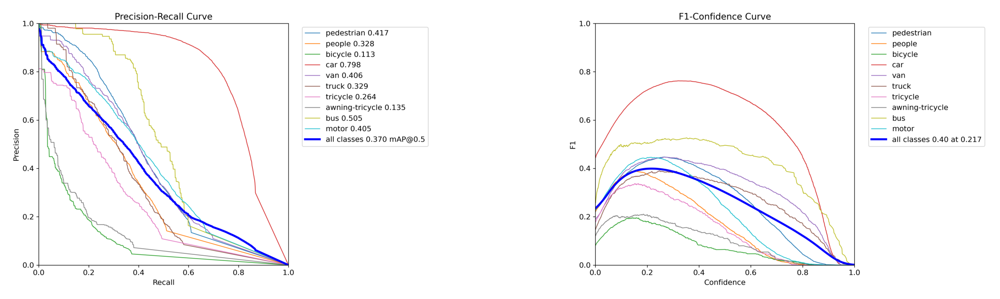

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

plt.figure(figsize=(28, 8))
plt.subplot(1, 2, 1)
img = Image.open('/content/drive/MyDrive/DLS_PROJECT/DETECTION/stage3/BoxPR_curve.png')
plt.imshow(img)
plt.axis('off')

plt.subplot(1, 2, 2)
img = Image.open('/content/drive/MyDrive/DLS_PROJECT/DETECTION/stage3/BoxF1_curve.png')
plt.imshow(img)
plt.axis('off');


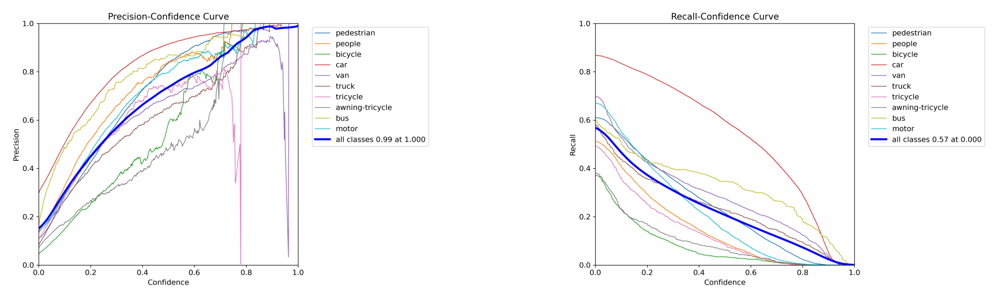

In [ ]:
plt.figure(figsize=(28, 8))
plt.subplot(1, 2, 1)
img = Image.open('/content/drive/MyDrive/DLS_PROJECT/DETECTION/stage3/BoxP_curve.png')
plt.imshow(img)
plt.axis('off')

plt.subplot(1, 2, 2)
img = Image.open('/content/drive/MyDrive/DLS_PROJECT/DETECTION/stage3/BoxR_curve.png')
plt.imshow(img)
plt.axis('off');